# load dataset

In [20]:
import pandas as pd
import re
import nltk
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords

In [21]:
data1 = pd.read_csv('mail_data.csv', encoding='latin-1')
data2 = pd.read_csv('Phishing_Email.csv', encoding='utf-8', on_bad_lines='skip', engine='python')


In [22]:
data1

,Category,Message
0,ham,"Go until jurong point, crazy.. Available only ..."
1,ham,Ok lar... Joking wif u oni...
2,spam,Free entry in 2 a wkly comp to win FA Cup fina...
3,ham,U dun say so early hor... U c already then say...
4,ham,"Nah I don't think he goes to usf, he lives aro..."
...,...,...
5567,spam,This is the 2nd time we have tried 2 contact u...
5568,ham,Will Ã¼ b going to esplanade fr home?
5569,ham,"Pity, * was in mood for that. So...any other s..."
5570,ham,The guy did some bitching but I acted like i'd...


In [23]:

data1.duplicated().sum()
data1.drop_duplicates(inplace=True)
data1.duplicated().sum()



np.int64(0)

In [24]:

data2.duplicated().sum()
data2.drop_duplicates(inplace=True)
data2.duplicated().sum()



np.int64(0)

In [25]:
data2 = data2[['Email Text', 'Email Type']]
data2

,Email Text,Email Type
0,"re : 6 . 1100 , disc : uniformitarianism , re ...",Safe Email
1,the other side of * galicismos * * galicismo *...,Safe Email
2,re : equistar deal tickets are you still avail...,Safe Email
3,\nHello I am your hot lil horny toy.\n I am...,Phishing Email
4,software at incredibly low prices ( 86 % lower...,Phishing Email
...,...,...
20693,date a lonely housewife always wanted to date ...,Phishing Email
20694,request submitted : access request for anita ....,Safe Email
20695,"re : important - prc mtg hi dorn & john , as y...",Safe Email
20696,press clippings - letter on californian utilit...,Safe Email


# pre-processing

In [26]:
import re

def preprocessing(msg):
    if not isinstance(msg, str):
        msg = str(msg)
    msg = lower_text(msg)
    msg = remove_special_characters(msg)
    msg = remove_numbers(msg)
    msg = remove_extra_spaces(msg)
    msg = remove_short_text(msg)
    msg = remove_emojis(msg)
    return msg

def lower_text(text):
    text = text.lower()
    return text

def remove_special_characters(text):
    text = re.sub(r'[^a-zA-Z\s]', '', text)
    return text

def remove_numbers(text):
    text = re.sub(r'\d+', '', text)
    return text

def remove_extra_spaces(text):
    text = re.sub(r'\s+', ' ', text).strip()
    return text

def remove_short_text(text, min_length=10):
    return text if len(text) >= min_length else ''

def remove_emojis(text):
    emoji_pattern = re.compile("[\U00010000-\U0010ffff]", flags=re.UNICODE)
    return emoji_pattern.sub(r'', text)

data1['Message'] = data1['Message'].apply(preprocessing)
data1 = data1[data1['Message'] != '']

data2['Email Text'] = data2['Email Text'].apply(preprocessing)
data2 = data2[data2['Email Text'] != '']


In [27]:
data1['Spam'] = data1['Category'].map({'spam': 1, 'ham': 0})
data1.drop(['Category'],axis = 1)

C:\Users\ASUS\AppData\Local\Temp\ipykernel_13616\1756508818.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data1['Spam'] = data1['Category'].map({'spam': 1, 'ham': 0})


,Message,Spam
0,go until jurong point crazy available only in ...,0
1,ok lar joking wif u oni,0
2,free entry in a wkly comp to win fa cup final ...,1
3,u dun say so early hor u c already then say,0
4,nah i dont think he goes to usf he lives aroun...,0
...,...,...
5567,this is the nd time we have tried contact u u ...,1
5568,will b going to esplanade fr home,0
5569,pity was in mood for that soany other suggestions,0
5570,the guy did some bitching but i acted like id ...,0


In [28]:
data2['Phishing'] = data2['Email Type'].map({'Phishing Email': 1, 'Safe Email': 0}).fillna(-1)
data2

C:\Users\ASUS\AppData\Local\Temp\ipykernel_13616\1821246777.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data2['Phishing'] = data2['Email Type'].map({'Phishing Email': 1, 'Safe Email': 0}).fillna(-1)


,Email Text,Email Type,Phishing
0,re disc uniformitarianism re sex lang dick hud...,Safe Email,0.0
1,the other side of galicismos galicismo is a sp...,Safe Email,0.0
2,re equistar deal tickets are you still availab...,Safe Email,0.0
3,hello i am your hot lil horny toy i am the one...,Phishing Email,1.0
4,software at incredibly low prices lower draper...,Phishing Email,1.0
...,...,...,...
20692,rick moen a crit im confused i thought it was ...,Safe Email,0.0
20693,date a lonely housewife always wanted to date ...,Phishing Email,1.0
20694,request submitted access request for anita dup...,Safe Email,0.0
20695,re important prc mtg hi dorn john as you disco...,Safe Email,0.0


stopword

In [29]:
import nltk
nltk.download('stopwords')
nltk.download('wordnet')



[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\ASUS\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\ASUS\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [30]:
import re
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

lemmatizer = WordNetLemmatizer()
stop_words = set(stopwords.words('english'))

slang_dict = {
    "u": "you",
    "ur": "your",
    "r": "are",
    "2": "to",
    "4": "for",
    "pls": "please",
    "plz": "please",
    "wif": "with",
    "dun": "don't",
    "wat": "what",
    "lar": "lah",
    "oni": "only",
    "tkts": "tickets",
    "n": "and",
    "c": "see",
    "b4": "before",
    "msg": "message",
    "txt": "text",
    "wkly": "weekly",
    "comp": "competition",
    "fa": "football association",
    "lil" : "little",
    "disc": "discount",

}


def process2_text(text, slang_dict):
    def replace_slang(text, slang_dict):
        words = text.split()
        replaced = [slang_dict.get(word, word) for word in words]  # Ganti slang jika ada di kamus
        return ' '.join(replaced)

    def remove_stopwords(text):
        words = text.split()
        filtered = [word for word in words if word not in stop_words]  # Hapus stopwords
        return ' '.join(filtered)

    def lemmatize_text(text):
        words = text.split()
        lemmatized = [lemmatizer.lemmatize(word) for word in words]  # Lemmatizing
        return ' '.join(lemmatized)

    # Pipeline pembersihan teks
    text = lower_text(text)
    text = replace_slang(text, slang_dict)
    text = remove_stopwords(text)
    text = lemmatize_text(text)
    return text

data1['Message'] = data1['Message'].apply(lambda x: process2_text(str(x), slang_dict))

data2['Message'] = data2['Email Text'].apply(lambda x: process2_text(str(x), slang_dict))
# data2[['Message']].head()
data1[['Message']].head()


C:\Users\ASUS\AppData\Local\Temp\ipykernel_13616\1992193306.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data1['Message'] = data1['Message'].apply(lambda x: process2_text(str(x), slang_dict))
C:\Users\ASUS\AppData\Local\Temp\ipykernel_13616\1992193306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data2['Message'] = data2['Email Text'].apply(lambda x: process2_text(str(x), slang_dict))


,Message
0,go jurong point crazy available bugis great wo...
1,ok lah joking
2,free entry weekly competition win football ass...
3,say early hor see already say
4,nah dont think go usf life around though


In [31]:
data1 = data1[['Message', 'Spam']]
data1

,Message,Spam
0,go jurong point crazy available bugis great wo...,0
1,ok lah joking,0
2,free entry weekly competition win football ass...,1
3,say early hor see already say,0
4,nah dont think go usf life around though,0
...,...,...
5567,nd time tried contact pound prize claim easy c...,1
5568,b going esplanade fr home,0
5569,pity mood soany suggestion,0
5570,guy bitching acted like id interested buying s...,0


In [32]:
data2 = data2[['Message', 'Phishing']]
data2

,Message,Phishing
0,discount uniformitarianism sex lang dick hudso...,0.0
1,side galicismos galicismo spanish term name im...,0.0
2,equistar deal ticket still available assist ro...,0.0
3,hello hot little horny toy one dream open mind...,1.0
4,software incredibly low price lower drapery se...,1.0
...,...,...
20692,rick moen crit im confused thought gpled money...,0.0
20693,date lonely housewife always wanted date lonel...,1.0
20694,request submitted access request anita dupont ...,0.0
20695,important prc mtg hi dorn john discovered rece...,0.0


In [33]:
d1 = data1
d1.to_csv('Spam after preprocessing.csv', index=False)

In [34]:
d2 = data2
d2.to_csv('Phising after prprocesiing.csv', index=False)

# EDA spam

In [35]:
spam_messages = d1[d1['Spam'] == 1]['Message']
ham_messages = d1[d1['Spam'] == 0]['Message']
print("Jumlah pesan spam:", len(spam_messages))
print("Jumlah pesan ham:", len(ham_messages))

Jumlah pesan spam: 639
Jumlah pesan ham: 4471


In [36]:
import pandas as pd

# Asumsikan d1 adalah DataFrame asli Anda dengan kolom 'Message' dan 'Spam'
# Asumsikan d1_smote telah dibuat menggunakan SMOTE dan memiliki beberapa pesan kosong.

# 1. Identifikasi Data Spam
data_spam = d1[d1['Spam'] == 1]

# 2. Hitung Berapa Banyak Data yang Perlu Diduplikasi
#    Kita akan duplikasi sampai jumlah data spam sama dengan jumlah data ham
jumlah_data_ham = len(d1[d1['Spam'] == 0])
jumlah_data_spam = len(data_spam)
jumlah_duplikasi = jumlah_data_ham - jumlah_data_spam

# 3. Duplikasi Data Spam (Jika diperlukan)
if jumlah_duplikasi > 0:
    data_spam_didup = pd.concat([data_spam] * (jumlah_duplikasi // jumlah_data_spam + 1), ignore_index=True)
    data_spam_didup = data_spam_didup.iloc[:jumlah_duplikasi]  # Ambil data sesuai jumlah duplikasi

    # 4. Gabungkan Data yang Diduplikasi ke Data Asli
    d1_oversampled = pd.concat([d1, data_spam_didup], ignore_index=True)
else:
    d1_oversampled = d1.copy()
# 5. hapus pesan kosong

d1_oversampled = d1_oversampled.dropna(subset=['Message'])
d1_oversampled = d1_oversampled[d1_oversampled['Message'] != '']

print("Jumlah data sebelum oversampling:", len(d1))
print("Jumlah data setelah oversampling:", len(d1_oversampled))
print("Jumlah data Spam:",len(d1_oversampled[d1_oversampled['Spam'] == 1]))
print("Jumlah data Ham:", len(d1_oversampled[d1_oversampled['Spam'] == 0]))

print(d1_oversampled[['Message', 'Spam']])

Jumlah data sebelum oversampling: 5110
Jumlah data setelah oversampling: 8937
Jumlah data Spam: 4471
Jumlah data Ham: 4466
                                                Message  Spam
0     go jurong point crazy available bugis great wo...     0
1                                         ok lah joking     0
2     free entry weekly competition win football ass...     1
3                         say early hor see already say     0
4              nah dont think go usf life around though     0
...                                                 ...   ...
8937  private account statement show unredeemed poin...     1
8938  private account statement show unredeemed sim ...     1
8939  want explicit sex sec ring cost pmin gsex pobo...     1
8940  asked mobile chatlines inclu free min india cu...     1
8941  contract mobile mnths latest motorola nokia et...     1

[8937 rows x 2 columns]


train test split (lewati)

In [37]:
!pip install imbalanced-learn==0.11.0


[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


# modeling using BoW

membuat kosa kata

In [38]:
d1_oversampled['Spam'].value_counts()

Spam
1    4471
0    4466
Name: count, dtype: int64

In [39]:
import random
import random
d1_oversampled_shuffled = d1_oversampled.sample(frac=1, random_state=42).reset_index(drop=True)

# Tentukan indeks untuk split
split_index = int(0.8 * len(d1_oversampled_shuffled))

# Split dataset menjadi train dan test
trainih= d1_oversampled_shuffled.iloc[:split_index]
testnih = d1_oversampled_shuffled.iloc[split_index:]
print("Jumlah data train:", len(trainih))
print("Jumlah data test:", len(testnih))


Jumlah data train: 7149
Jumlah data test: 1788


pemisahan spam dan ham

In [40]:
spam_messages = d1_oversampled_shuffled[d1_oversampled_shuffled['Spam'] == 1]['Message']
ham_messages = d1_oversampled_shuffled[d1_oversampled_shuffled['Spam'] == 0]['Message']
print("Jumlah pesan spam:", len(spam_messages))
print("Jumlah pesan ham:", len(ham_messages))

Jumlah pesan spam: 4471
Jumlah pesan ham: 4466


frekuensi kata

In [41]:
from collections import defaultdict
ham_word_counts = defaultdict(int)
spam_word_counts = defaultdict(int)

total_spam_words = 0
total_ham_words = 0

for message in spam_messages:
    for word in message.split():
        spam_word_counts[word] += 1
        total_spam_words += 1

for message in ham_messages:
    for word in message.split():
        ham_word_counts[word] += 1
        total_ham_words += 1
print("Kata dalam Spam:", dict(spam_word_counts))
print("Kata dalam Ham:", dict(ham_word_counts))
print("Total Kata Spam:", total_spam_words)
print("Total Kata Ham:", total_ham_words)

Kata dalam Spam: {'dorothykiefercom': 7, 'bank': 14, 'granite': 14, 'issue': 14, 'strongbuy': 14, 'explosive': 14, 'pick': 14, 'member': 42, 'nasdaq': 14, 'symbol': 14, 'cdgt': 14, 'per': 279, 'send': 399, 'logo': 28, 'lover': 14, 'name': 132, 'joined': 14, 'heart': 21, 'text': 1721, 'love': 70, 'mobno': 14, 'eg': 77, 'adam': 14, 'eve': 35, 'yahoo': 14, 'poboxwwq': 28, 'txtno': 14, 'ad': 14, 'p': 440, 'urgent': 392, 'call': 2154, 'landline': 203, 'complimentary': 70, 'ibiza': 21, 'holiday': 182, 'cash': 350, 'await': 105, 'collection': 147, 'sae': 119, 'tc': 294, 'po': 182, 'box': 266, 'sk': 14, 'wp': 14, 'ppm': 238, 'dating': 105, 'service': 448, 'asked': 35, 'contact': 335, 'someone': 91, 'shy': 7, 'revealed': 28, 'pobox': 140, 'uz': 21, 'today': 217, 'voda': 35, 'number': 245, 'ending': 49, 'selected': 147, 'receive': 182, 'award': 175, 'match': 91, 'please': 398, 'quoting': 35, 'claim': 671, 'code': 182, 'standard': 42, 'rate': 175, 'app': 28, 'tried': 111, 'reply': 664, 'offer': 2

In [42]:
vocabulary = set(" ".join(d1_oversampled['Message']).split())
vocab_size = len(vocabulary)


prior probability

In [43]:
p_spam_train = len(spam_messages) / len(trainih)
p_ham_train= len(ham_messages) / len(trainih) #prior probability
print("Prior Probability Spam:", p_spam_train)
print("Prior Probability Ham:", p_ham_train)

Prior Probability Spam: 0.6254021541474332
Prior Probability Ham: 0.6247027556301581


conditional probability

In [44]:

def calculate_word_probabilities(word_counts, total_words, vocab_size):
    probabilities = {}
    for word in vocabulary:
        probabilities[word] = (word_counts[word] + 1) / (total_words + vocab_size)  # Laplace smoothing
    return probabilities
spam_word_probs = calculate_word_probabilities(spam_word_counts, total_spam_words, vocab_size) #conditional probability
ham_word_probs= calculate_word_probabilities(ham_word_counts, total_ham_words, vocab_size)
print("Conditional Probability Spam:", spam_word_probs)
print("Conditional Probability Ham:", ham_word_probs)


Conditional Probability Spam: {'kettoda': 1.4428348819761066e-05, 'ptxt': 0.00011542679055808853, 'ana': 1.4428348819761066e-05, 'single': 0.0005194205575113984, 'neft': 1.4428348819761066e-05, 'freefone': 0.00031742367403474344, 'feelingwavering': 1.4428348819761066e-05, 'alrite': 1.4428348819761066e-05, 'property': 1.4428348819761066e-05, 'friendofafriend': 1.4428348819761066e-05, 'ssnervous': 1.4428348819761066e-05, 'go': 0.003044381600969585, 'gd': 1.4428348819761066e-05, 'shudvetold': 1.4428348819761066e-05, 'inforingtonekingcouk': 0.00011542679055808853, 'lived': 1.4428348819761066e-05, 'oursso': 1.4428348819761066e-05, 'speling': 1.4428348819761066e-05, 'holidayso': 1.4428348819761066e-05, 'yalrigu': 1.4428348819761066e-05, 'shit': 0.00011542679055808853, 'muz': 0.000216425232296416, 'instantly': 0.00011542679055808853, 'upset': 1.4428348819761066e-05, 'intha': 1.4428348819761066e-05, 'yr': 0.0018324003001096555, 'fast': 0.00011542679055808853, 'advice': 1.4428348819761066e-05, 

In [45]:
import numpy as np
def predict_naive_bayes(message):
    perkata = message.split()

    spam_prob = np.log(p_spam_train)  #di log biarv mencegah underflow, dan prior probability yang sebelumnya, jadi harusnya p_spam_train
    ham_prob = np.log(p_ham_train)

    for kata in perkata:
        spam_prob += np.log(spam_word_probs.get(kata, 1 / (total_spam_words + vocab_size))) #p (word |spam), jika tidak ada maka menggunakan laplace smoothing
        ham_prob += np.log(ham_word_probs.get(kata, 1 / (total_ham_words + vocab_size)))

        #Jika spam_prob1 lebih besar dari ham_prob1, maka email tersebut diprediksi sebagai spam (return 1).
        #Jika spam_prob1 lebih besar" artinya nilai akhir (setelah log probabilitas dari semua kata ditambahkan)
         #dari spam_prob1 lebih besar daripada nilai akhir dari ham_prob1.
        #Ini menunjukkan bahwa model kita lebih yakin bahwa email tersebut adalah spam.


    return 1 if spam_prob > ham_prob else 0

trainih['Predicted'] = trainih['Message'].apply(predict_naive_bayes)
df_train = trainih[['Message', 'Spam', 'Predicted']]
df_train

C:\Users\ASUS\AppData\Local\Temp\ipykernel_13616\972299716.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trainih['Predicted'] = trainih['Message'].apply(predict_naive_bayes)


,Message,Spam,Predicted
0,naughty little thought better flirt flirt flir...,0,0
1,dorothykiefercom bank granite issue strongbuy ...,1,1
2,good good job like entrepreneur,0,0
3,send logo lover name joined heart text love na...,1,1
4,urgent call landline complimentary ibiza holid...,1,1
...,...,...,...
7144,joining today formallypls keep prayingwill tal...,0,0
7145,sure night menu know noon menu,0,0
7146,wn hurt prsn close fight wit dem coz somtimes ...,0,0
7147,dont forget place many free request stchoiceco...,1,1


Akurasi Model: 0.985452510840677
Laporan Klasifikasi:
               precision    recall  f1-score   support

           0       0.99      0.98      0.99      3565
           1       0.98      0.99      0.99      3584

    accuracy                           0.99      7149
   macro avg       0.99      0.99      0.99      7149
weighted avg       0.99      0.99      0.99      7149



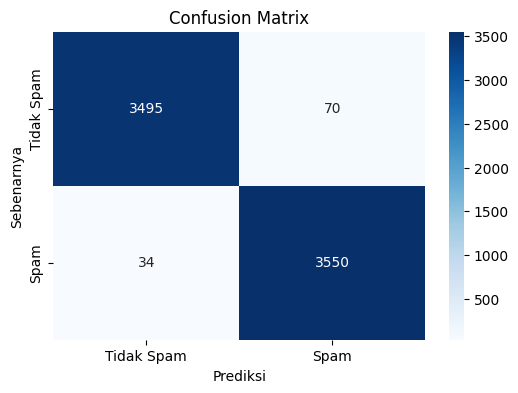

In [46]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# evaluasi data train resampled
accuracy = accuracy_score(df_train['Spam'], df_train['Predicted']) #mengubah dari train menjadi train_resampled
print("Akurasi Model:", accuracy)
print("Laporan Klasifikasi:\n", classification_report(df_train['Spam'], df_train['Predicted'])) #mengubah dari train menjadi train_resampled

# Confusion Matrix data train
cm = confusion_matrix(df_train['Spam'], df_train['Predicted']) #mengubah dari train menjadi train_resampled
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Tidak Spam', 'Spam'], yticklabels=['Tidak Spam', 'Spam'])
plt.xlabel('Prediksi')
plt.ylabel('Sebenarnya')
plt.title('Confusion Matrix')
plt.show()


In [47]:

testnih['Predicted'] = testnih['Message'].apply(predict_naive_bayes)
df_test = testnih[['Message', 'Spam', 'Predicted']]
df_test

C:\Users\ASUS\AppData\Local\Temp\ipykernel_13616\1706770627.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  testnih['Predicted'] = testnih['Message'].apply(predict_naive_bayes)


,Message,Spam,Predicted
7149,contacted dating service someone know find cal...,1,1
7150,join uk horniest dogging service sex nite sign...,1,1
7151,nt yet chikkusimple habbahw abt,0,0
7152,got part nottingham hr mile good thing love ma...,0,0
7153,hows pain deary smiling,0,0
...,...,...,...
8932,urgent trying contact last weekend draw show p...,1,1
8933,new textbuddy chat horny guy area p free recei...,1,1
8934,urgent costa del sol holiday await collection ...,1,1
8935,wifehow knew time murder exactly,0,0


Akurasi Model: 0.9848993288590604
Laporan Klasifikasi:
               precision    recall  f1-score   support

           0       0.99      0.98      0.98       901
           1       0.98      0.99      0.98       887

    accuracy                           0.98      1788
   macro avg       0.98      0.98      0.98      1788
weighted avg       0.98      0.98      0.98      1788



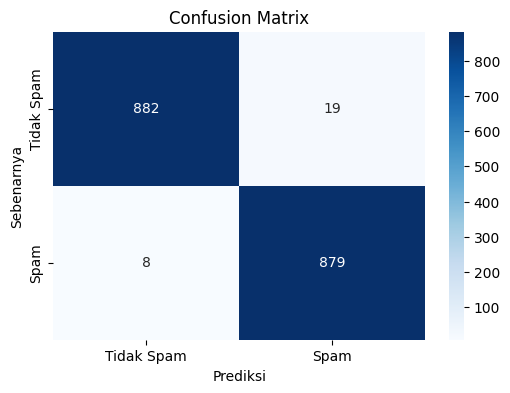

In [48]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix


accuracy = accuracy_score(df_test['Spam'], df_test['Predicted'])
print("Akurasi Model:", accuracy)
print("Laporan Klasifikasi:\n", classification_report(df_test['Spam'], df_test['Predicted']))

cm = confusion_matrix(df_test['Spam'],df_test['Predicted'])

# Menampilkan confusion matrix dengan seaborn heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Tidak Spam', 'Spam'], yticklabels=['Tidak Spam', 'Spam'])
plt.xlabel('Prediksi')
plt.ylabel('Sebenarnya')
plt.title('Confusion Matrix')
plt.show()


# EDA Phising

In [49]:
d2['Phishing'].value_counts()

Phishing
 0.0    11119
 1.0     6969
-1.0        9
Name: count, dtype: int64

In [50]:
import pandas as pd

kondisi = d2['Phishing'] != -1.0

d2 = d2[kondisi]

print("Jumlah baris di d2_bersih setelah menghapus -1:", len(d2))
print("Nilai yang unik pada kolom phishing :", d2['Phishing'].unique())
print(d2['Phishing'].value_counts())


Jumlah baris di d2_bersih setelah menghapus -1: 18088
Nilai yang unik pada kolom phishing : [0. 1.]
Phishing
0.0    11119
1.0     6969
Name: count, dtype: int64


In [51]:
d2.duplicated().sum()


np.int64(958)

In [52]:
import pandas as pd

# Asumsikan d2 adalah DataFrame asli Anda dengan kolom 'Message' dan 'Phishing'
# dan d1 sudah didefinisikan

# 1. Identifikasi Data Phishing
data_phishing = d2[d2['Phishing'] == 1]

# 2. Hitung Berapa Banyak Data yang Perlu Diduplikasi
jumlah_data_safe = len(d2[d2['Phishing'] == 0])
jumlah_data_phishing = len(data_phishing)
jumlah_duplikasi = jumlah_data_safe - jumlah_data_phishing  #perbaiki disini menjadi jumlah data safe - phishing

# 3. Duplikasi Data Phishing (Jika diperlukan)
if jumlah_duplikasi > 0:
    data_phishing_didup = pd.concat([data_phishing] * (jumlah_duplikasi // jumlah_data_phishing + 1), ignore_index=True)
    data_phishing_didup = data_phishing_didup.iloc[:jumlah_duplikasi]

    # 4. Gabungkan Data yang Diduplikasi ke Data Asli
    d2_oversampled = pd.concat([d2, data_phishing_didup], ignore_index=True) #perbaiki konkatenasi disini
else:
    d2_oversampled = d2.copy()

# 5. Hapus pesan kosong
d2_oversampled = d2_oversampled.dropna(subset=['Message'])
d2_oversampled = d2_oversampled[d2_oversampled['Message'] != '']

print("Jumlah data sebelum oversampling:", len(d2))
print("Jumlah data setelah oversampling:", len(d2_oversampled))
print("Jumlah data Phishing:", len(d2_oversampled[d2_oversampled['Phishing'] == 1])) #perbaiki nama kolom
print("Jumlah data Safe:", len(d2_oversampled[d2_oversampled['Phishing'] == 0])) #perbaiki nama kolom

d2_oversampled = d2_oversampled[['Message', 'Phishing']]
d2_oversampled

Jumlah data sebelum oversampling: 18088
Jumlah data setelah oversampling: 22238
Jumlah data Phishing: 11119
Jumlah data Safe: 11119


,Message,Phishing
0,discount uniformitarianism sex lang dick hudso...,0.0
1,side galicismos galicismo spanish term name im...,0.0
2,equistar deal ticket still available assist ro...,0.0
3,hello hot little horny toy one dream open mind...,1.0
4,software incredibly low price lower drapery se...,1.0
...,...,...
22233,fluid analysis customer speak volume spur prod...,1.0
22234,cheapest med find discount drug save including...,1.0
22235,dont spend hundred even thousand dollar top so...,1.0
22236,received helo webmillioncom mxclustercharterne...,1.0


In [53]:
d2_oversampled['Phishing'].value_counts()

Phishing
0.0    11119
1.0    11119
Name: count, dtype: int64

In [54]:
import random
import random
d2_oversampled_shuffled = d2_oversampled.sample(frac=1, random_state=42).reset_index(drop=True)

# Tentukan indeks untuk split
split_index = int(0.8 * len(d2_oversampled_shuffled))

# Split dataset menjadi train dan test
trainih= d2.iloc[:split_index]
testnih = d2_oversampled_shuffled.iloc[split_index:]
print("Jumlah data train:", len(trainih))
print("Jumlah data test:", len(testnih))


Jumlah data train: 17790
Jumlah data test: 4448


In [55]:
Phishing_messages = d2_oversampled_shuffled[d2_oversampled_shuffled['Phishing'] == 1]['Message']
Safe_messages = d2_oversampled_shuffled[d2_oversampled_shuffled['Phishing'] == 0]['Message']
print("Jumlah pesan Phishing:", len(Phishing_messages))
print("Jumlah pesan Safe:", len(Safe_messages))

Jumlah pesan Phishing: 11119
Jumlah pesan Safe: 11119


In [56]:
from collections import defaultdict
Safe_word_counts = defaultdict(int)
Phishing_word_counts = defaultdict(int)

total_Phishing_words = 0
total_Safe_words = 0

for message in Phishing_messages:
    for word in message.split():
        Phishing_word_counts[word] += 1
        total_Phishing_words += 1

for message in Safe_messages:
    for word in message.split():
        Safe_word_counts[word] += 1
        total_Safe_words += 1
print("Kata dalam Spam:", dict(Phishing_word_counts))
print("Kata dalam Ham:", dict(Safe_word_counts))
print("Total Kata Spam:", total_Phishing_words)
print("Total Kata Ham:", total_Safe_words)

Kata dalam Spam: {'need': 3294, 'graphic': 476, 'artist': 161, 'come': 1552, 'thinking': 223, 'breathing': 106, 'new': 4801, 'life': 1896, 'business': 6109, 'start': 1554, 'revamping': 95, 'front': 310, 'endlogo': 41, 'visualidentity': 41, 'offer': 3710, 'creative': 361, 'custom': 275, 'design': 438, 'ioqos': 22, 'stationery': 234, 'web': 2292, 'site': 3583, 'carefui': 62, 'hand': 590, 'thesepowerful': 26, 'marketinq': 64, 'tool': 601, 'wiil': 379, 'brinq': 57, 'breath': 114, 'fresh': 342, 'air': 434, 'make': 4537, 'stand': 321, 'amongthe': 22, 'competitor': 215, 'click': 4629, 'away': 653, 'future': 2457, 'success': 985, 'ciick': 135, 'see': 4193, 'sample': 284, 'artwork': 110, 'checkour': 41, 'price': 4563, 'hot': 589, 'interested': 1007, 'pharm': 25, 'great': 1410, 'cheri': 11, 'refill': 83, 'notification': 348, 'ref': 230, 'jf': 4, 'dear': 856, 'bruceg': 38, 'em': 281, 'ca': 724, 'automated': 95, 'system': 2270, 'identified': 339, 'likely': 83, 'ready': 740, 'recent': 414, 'online'

In [57]:
vocabulary = set(" ".join(d2_oversampled['Message']).split())
vocab_size = len(vocabulary)


prior probability

In [58]:
p_phishing_train = len(Phishing_messages) / len(trainih)
p_safe_train= len(Safe_messages) / len(trainih) #prior probability
print("Prior Probability Phising:", p_spam_train)
print("Prior Probability Safe:", p_ham_train)

Prior Probability Phising: 0.6254021541474332
Prior Probability Safe: 0.6247027556301581


In [65]:
def calculate_word_probabilities(word_counts, total_words, vocab_size):
    probabilities = {}
    for word in vocabulary:
        probabilities[word] = (word_counts[word] + 1) / (total_words + vocab_size)  # Laplace smoothing
    return probabilities
Phishing_word_probs = calculate_word_probabilities(Phishing_word_counts, total_Phishing_words, vocab_size) #conditional probability
Safe_word_probs= calculate_word_probabilities(Safe_word_counts, total_Safe_words, vocab_size)
print("Conditional Probability Phising:", Phishing_word_probs)
print("Conditional Probability Safe:", Safe_word_probs)

Conditional Probability Phising: {'tilby': 5.657820664058411e-07, 'ejaculte': 1.6973461992175234e-06, 'ninos': 5.657820664058411e-07, 'specificallydefined': 5.657820664058411e-07, 'pharmacological': 1.6973461992175234e-06, 'eliipsis': 5.657820664058411e-07, 'httpspamassassinorg': 5.657820664058411e-07, 'integercurrval': 5.657820664058411e-07, 'ludicrous': 5.657820664058411e-07, 'edrkdd': 1.6973461992175234e-06, 'dpvd': 1.6973461992175234e-06, 'bugshernando': 5.657820664058411e-07, 'neues': 3.3946923984350467e-06, 'spfzx': 1.6973461992175234e-06, 'argizabal': 5.657820664058411e-07, 'redesigned': 6.223602730464252e-06, 'novv': 9.618295128899299e-06, 'alster': 2.8289103320292056e-06, 'xngqksi': 1.6973461992175234e-06, 'momental': 3.3946923984350467e-06, 'httpwwwdietspecialscomtestimonialsshtmlto': 4.526256531246729e-06, 'reyero': 5.657820664058411e-07, 'squire': 5.657820664058411e-07, 'spoolers': 5.657820664058411e-07, 'httpfreshmeatnetuserskrasic': 5.657820664058411e-07, 'embodies': 2.26

In [61]:
import numpy as np
def predict_naive_bayes(message):
    perkata = message.split()

    phishing_prob = np.log(p_spam_train)  #di log biarv mencegah underflow, dan prior probability yang sebelumnya, jadi harusnya p_spam_train
    safe_prob = np.log(p_ham_train)

    for kata in perkata:
        phishing_prob += np.log(Phishing_word_probs.get(kata, 1 / (total_Phishing_words + vocab_size))) #p (word |spam), jika tidak ada maka menggunakan laplace smoothing
        safe_prob += np.log(Safe_word_probs.get(kata, 1 / (total_Safe_words + vocab_size)))

        #Jika spam_prob1 lebih besar dari ham_prob1, maka email tersebut diprediksi sebagai spam (return 1).
        #Jika spam_prob1 lebih besar" artinya nilai akhir (setelah log probabilitas dari semua kata ditambahkan)
         #dari spam_prob1 lebih besar daripada nilai akhir dari ham_prob1.
        #Ini menunjukkan bahwa model kita lebih yakin bahwa email tersebut adalah spam.


    return 1 if phishing_prob > safe_prob else 0

trainih['Predicted'] = trainih['Message'].apply(predict_naive_bayes)
df_train2 = trainih[['Message', 'Phishing', 'Predicted']]
df_train2

C:\Users\ASUS\AppData\Local\Temp\ipykernel_13616\3503632453.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trainih['Predicted'] = trainih['Message'].apply(predict_naive_bayes)


,Message,Phishing,Predicted
0,discount uniformitarianism sex lang dick hudso...,0.0,0
1,side galicismos galicismo spanish term name im...,0.0,0
2,equistar deal ticket still available assist ro...,0.0,0
3,hello hot little horny toy one dream open mind...,1.0,1
4,software incredibly low price lower drapery se...,1.0,1
...,...,...,...
20381,dg energy software vince edited version softwa...,0.0,0
20382,chance get new logo working company image star...,1.0,1
20383,pm elvineircomnet wrotecirca mbmb web space po...,0.0,0
20384,update origination schedule added orig dealmak...,0.0,0


Akurasi Model: 0.9903878583473862
Laporan Klasifikasi:
               precision    recall  f1-score   support

         0.0       0.99      0.99      0.99     10931
         1.0       0.98      0.99      0.99      6859

    accuracy                           0.99     17790
   macro avg       0.99      0.99      0.99     17790
weighted avg       0.99      0.99      0.99     17790



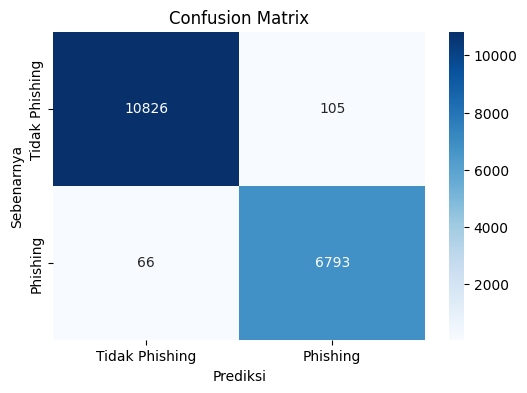

In [62]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# evaluasi data train resampled
accuracy = accuracy_score(df_train2['Phishing'], df_train2['Predicted']) #mengubah dari train menjadi train_resampled
print("Akurasi Model:", accuracy)
print("Laporan Klasifikasi:\n", classification_report(df_train2['Phishing'], df_train2['Predicted'])) #mengubah dari train menjadi train_resampled

# Confusion Matrix data train
cm = confusion_matrix(df_train2['Phishing'], df_train2['Predicted']) #mengubah dari train menjadi train_resampled
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Tidak Phishing', 'Phishing'], yticklabels=['Tidak Phishing', 'Phishing'])
plt.xlabel('Prediksi')
plt.ylabel('Sebenarnya')
plt.title('Confusion Matrix')
plt.show()


In [63]:

testnih['Predicted'] = testnih['Message'].apply(predict_naive_bayes)
df_test2 = testnih[['Message', 'Phishing', 'Predicted']]
df_test2

C:\Users\ASUS\AppData\Local\Temp\ipykernel_13616\830125660.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  testnih['Predicted'] = testnih['Message'].apply(predict_naive_bayes)


,Message,Phishing,Predicted
17790,panenergy marketing exchange deal sitara could...,0.0,0
17791,tim another area potentially fruitful study cl...,0.0,0
17792,team builder reminder august th four season ho...,0.0,0
17793,final call penn ling colloquium call paper pen...,0.0,0
17794,url httpboingboingnet date suppliedrob pringle...,0.0,0
...,...,...,...
22233,tue patton tony wrote someone translate lost s...,0.0,0
22234,online doctor write free prescription bottle b...,1.0,1
22235,enymex brad may consider targeting wide audien...,0.0,0
22236,wip report attached updated wip report week th...,0.0,0


*italicized text*

Akurasi Model: 0.9889838129496403
Laporan Klasifikasi:
               precision    recall  f1-score   support

         0.0       0.99      0.99      0.99      2218
         1.0       0.99      0.99      0.99      2230

    accuracy                           0.99      4448
   macro avg       0.99      0.99      0.99      4448
weighted avg       0.99      0.99      0.99      4448



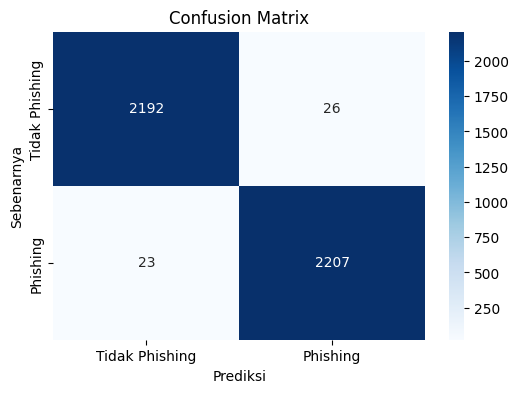

In [64]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix


accuracy = accuracy_score(df_test2['Phishing'], df_test2['Predicted'])
print("Akurasi Model:", accuracy)
print("Laporan Klasifikasi:\n", classification_report(df_test2['Phishing'], df_test2['Predicted']))

cm = confusion_matrix(df_test2['Phishing'],df_test2['Predicted'])

# Menampilkan confusion matrix dengan seaborn heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Tidak Phishing', 'Phishing'], yticklabels=['Tidak Phishing', 'Phishing'])
plt.xlabel('Prediksi')
plt.ylabel('Sebenarnya')
plt.title('Confusion Matrix')
plt.show()
